In [13]:
import glob

import einops
import matplotlib.pyplot as plt
import numpy as np
import pydicom
import SimpleITK as sitk

In [14]:
dcm = pydicom.dcmread(
    "/root/projs/rili/RILI-2019-2020/RP-2019-46p111ct/000218422H_20191128/RS.1.2.246.352.221.524678817940889270816305206575501358253.dcm"
)

In [15]:
dcm

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 190
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: RT Structure Set Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.246.352.221.524678817940889270816305206575501358253
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.246.352.70.2.1.160.3
(0002, 0013) Implementation Version Name         SH: 'DCIE 2.2'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 192'
(0008, 0012) Instance Creation Date              DA: '20220701'
(0008, 0013) Instance Creation Time              TM: '162104'
(0008, 0016) SOP Class UID                       UI: RT Structure Set Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.246.352.221.5246788179408892708163052065755

In [16]:
dcm_cts_name = [
    f"/root/projs/rili/RILI-2019-2020/RP-2019-46p111ct/000218422H_20191128/CT.{p.ReferencedSOPInstanceUID}.dcm"
    for p in dcm.ReferencedFrameOfReferenceSequence[0]
    .RTReferencedStudySequence[0]
    .RTReferencedSeriesSequence[0]
    .ContourImageSequence
]

In [17]:
sitk_mask = sitk.ReadImage("/root/projs/rili/RILI-2019-2020/RP-2019-46p111ct-nifty/000218422H_20191128.nii.gz")
mask_imgs = sitk.GetArrayFromImage(sitk_mask)

start, end = [[i for i, img in enumerate(mask_imgs) if np.sum(img) > 1][j] for j in [0, -1]]

In [18]:
sitk_dcms_ct = sitk.ReadImage(dcm_cts_name)
ct_imgs = sitk.GetArrayFromImage(sitk_dcms_ct)

np.min(ct_imgs)

-1000

-975 -652.0 -377.0 -95.25 240 -373.57973590655155 300.23094440005553


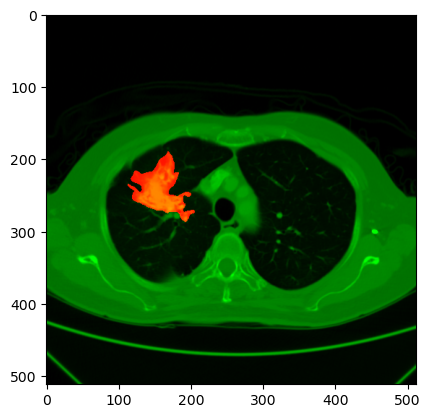

In [43]:
idxx = 51
a = ct_imgs[idxx][mask_imgs[idxx] == 1]
print(np.min(a), np.quantile(a, 0.25), np.median(a), np.quantile(a, 0.75), np.max(a), np.mean(a), np.std(a))
plt.imshow(einops.rearrange(np.array([mask_imgs[idxx], ((ct_imgs[idxx].copy() + 1000) / 2000).clip(0, 1), np.zeros((512, 512))]), "c h w -> h w c"))
plt.show()

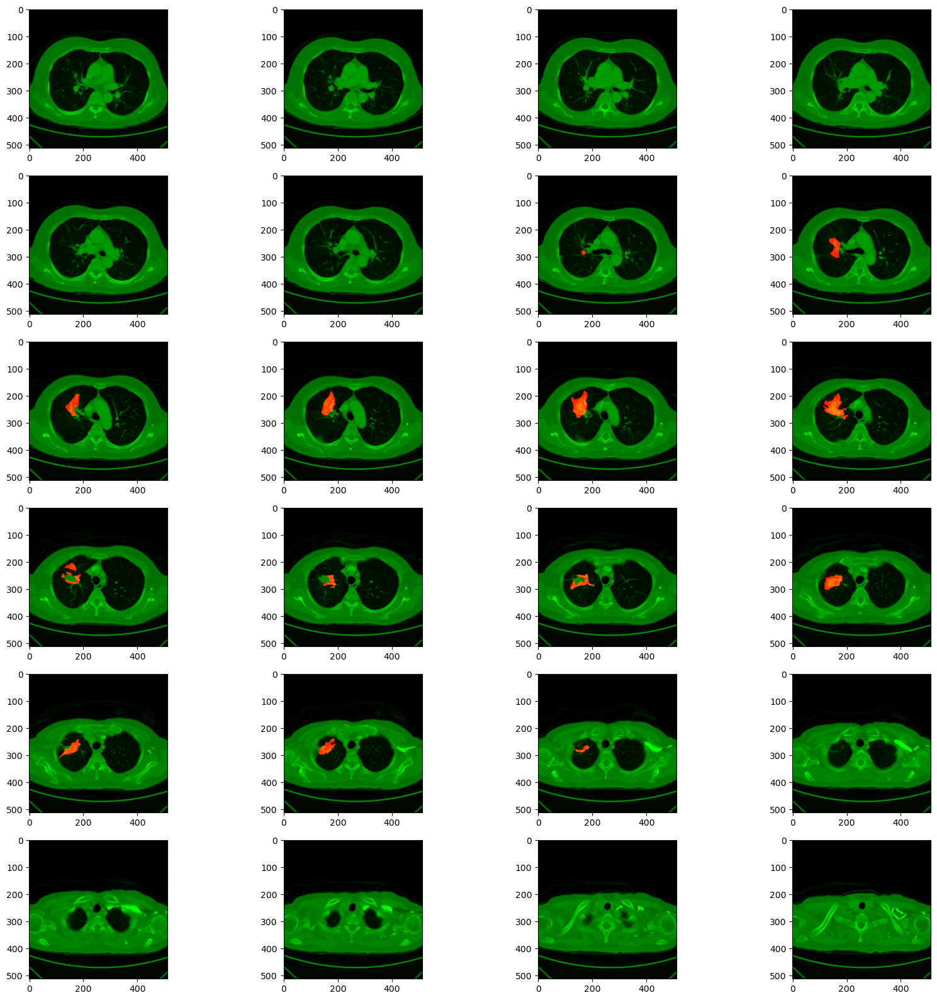

In [36]:
plt.figure(figsize=(20, 20))
for i in range(4 * 6):
    plt.subplot(6, 4, i + 1)
    i += 40
    cct_imgs = ((ct_imgs[i].copy() + 1000) / 2000).clip(0, 1)
    # cct_imgs[cct_imgs>0.4] = 0
    plt.imshow(einops.rearrange(np.array([mask_imgs[i], cct_imgs, np.zeros((512, 512))]), "c h w -> h w c"))

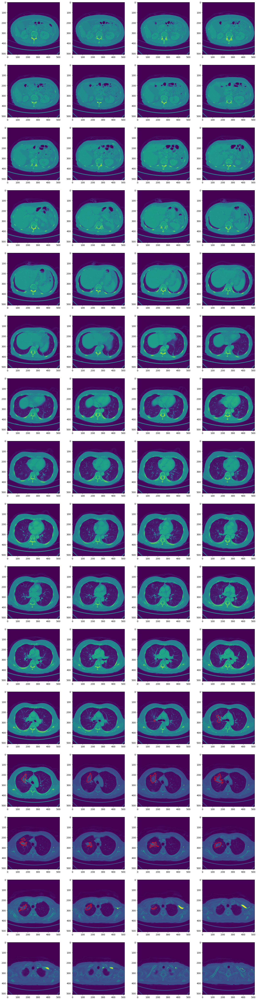

In [117]:
plt.figure(figsize=(20, 80))
for i in range(8 * 8):
    plt.subplot(16, 4, i + 1)
    plt.imshow(ct_imgs[i])
    contours, hir = cv2.findContours(np.array(mask_imgs[i], np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    for c in contours:
        plt.plot(c[:, 0, 0], c[:, 0, 1], color="red")

In [101]:
import cv2

contours, hir = cv2.findContours(np.array(mask_imgs[52], np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

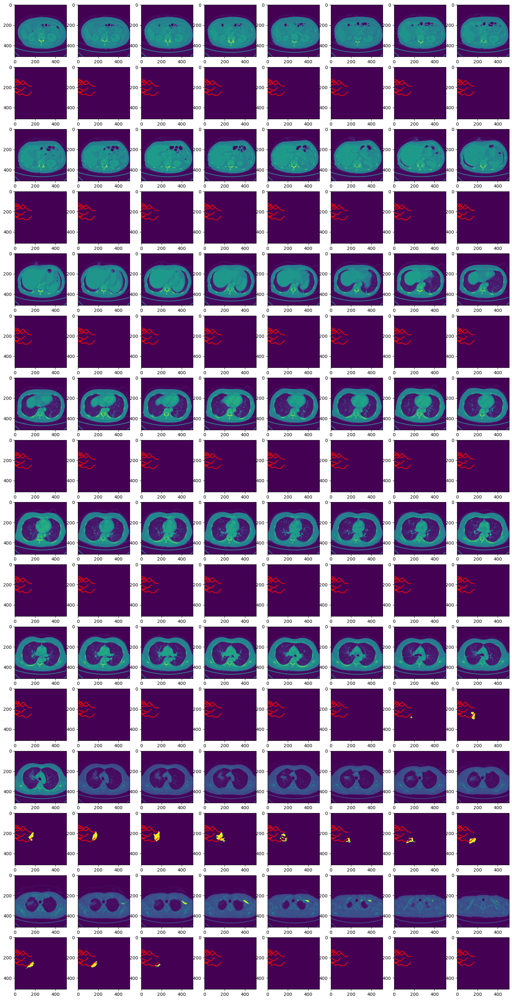

In [98]:
plt.figure(figsize=(20, 40))
for i in range(8 * 8):
    plt.subplot(16, 8, i % 8 + 16 * (i // 8) + 1)
    plt.imshow(ct_imgs[i])
    plt.subplot(16, 8, i % 8 + 16 * (i // 8) + 9)
    plt.imshow(mask_imgs[i])
    for c in contours:
        plt.plot(c[:, 0, ::-1], color="red")

In [102]:
contours[1][:, 0]

array([[126, 242],
       [125, 243],
       [124, 244],
       [124, 245],
       [123, 246],
       [123, 247],
       [122, 248],
       [122, 249],
       [121, 250],
       [120, 251],
       [120, 252],
       [120, 253],
       [120, 254],
       [120, 255],
       [121, 256],
       [122, 257],
       [123, 257],
       [124, 257],
       [125, 257],
       [126, 257],
       [127, 257],
       [128, 257],
       [129, 256],
       [130, 255],
       [131, 254],
       [131, 253],
       [132, 252],
       [132, 251],
       [132, 250],
       [132, 249],
       [131, 248],
       [130, 247],
       [130, 246],
       [129, 245],
       [128, 244],
       [127, 243],
       [127, 242]], dtype=int32)

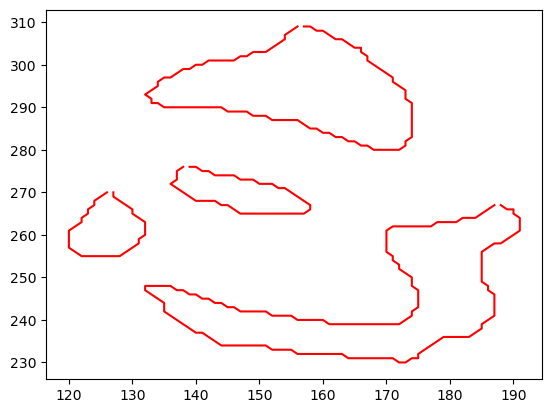

In [113]:
for c in contours:
    plt.plot(c[:, 0, 0], 512 - c[:, 0, 1], color="red")

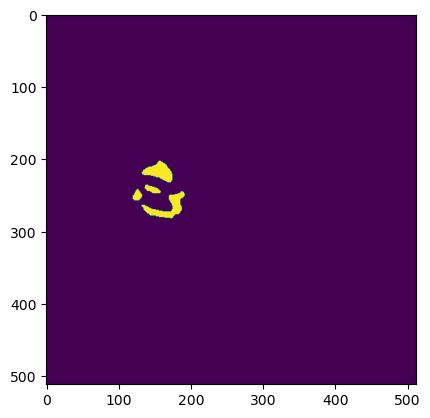

In [95]:
plt.imshow(mask_imgs[52])